In [3]:

import numpy as np 
import pandas as pd
import os
import seaborn as sns
#print(os.listdir("../input"))
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)
from wordcloud import WordCloud
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm
import re
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk


## Reading File with Pandas<a id="2"></a> <br>

In [4]:
df=pd.read_csv(r"C:\Users\srika\Downloads\archive (33)\zomato.csv")

## Brief Understanding of dataset<a id="2"></a> <br>


In [5]:
print("dataset contains {} rows and {} columns".format(df.shape[0],df.shape[1]))

dataset contains 51717 rows and 17 columns


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [7]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


## Exploratory data analysis

## What are the top restaurant chains in Bangaluru?


Text(0.5, 0, 'Number of outlets')

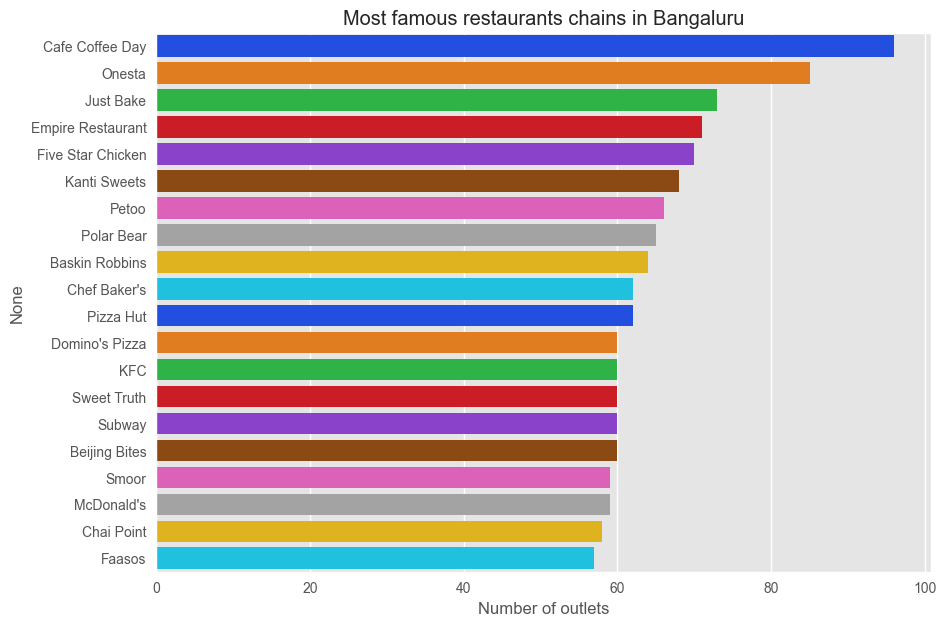

In [15]:
plt.figure(figsize=(10,7))
chains=df['name'].value_counts()[:20]
sns.barplot(x=chains,y=chains.index,palette='bright')
plt.title("Most famous restaurants chains in Bangaluru")
plt.xlabel("Number of outlets")

- As you can see **Cafe coffee day,Onesta,Just Bake** has the most number of outlets in and around bangalore.

## How many of the restuarants do not accept online orders?


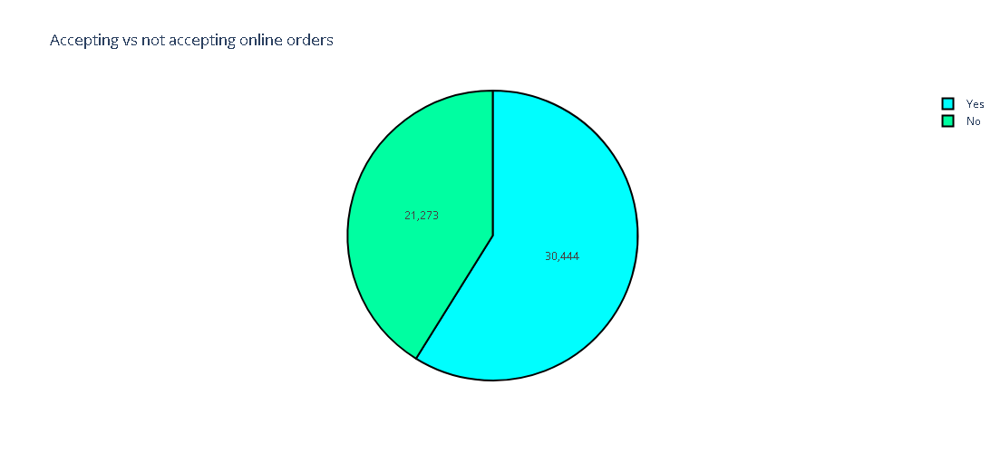

In [16]:
x=df['online_order'].value_counts()
colors = ['#00fefe', '#00fea1']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Accepting vs not accepting online orders",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')
    
    
    

1. As clearly indicated,almost 60 per cent of restaurants in Banglore accepts online orders.
2. Nearly 40 per cent of the restaurants do not accept online orders.
3. This might be because of the fact that these restaurants cannot afford to pay commission to zomoto for giving them orders online.
   zomato may want to consider giving them some more benefits if they want to increse the number of restaurants serving their customers online.


## Rating distribution


<AxesSubplot: xlabel='rate', ylabel='Density'>

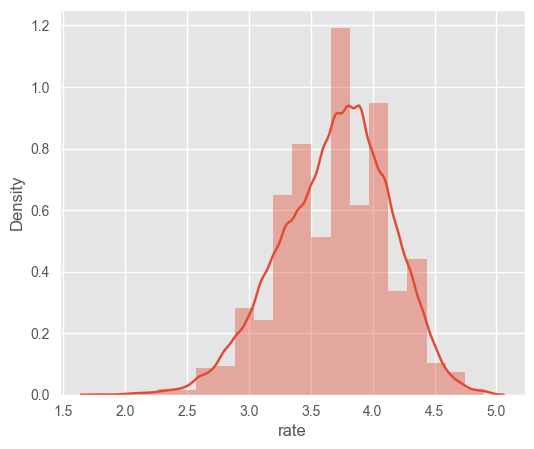

In [17]:
plt.figure(figsize=(6,5))
rating=df['rate'].dropna().apply(lambda x : float(x.split('/')[0]) if (len(x)>3)  else np.nan ).dropna()
sns.distplot(rating,bins=20)

1. Almost more than 50 percent of restaurants has rating between 3 and 4.
2. Restaurants having rating more than 4.5 are very rare.

## Cost vs rating

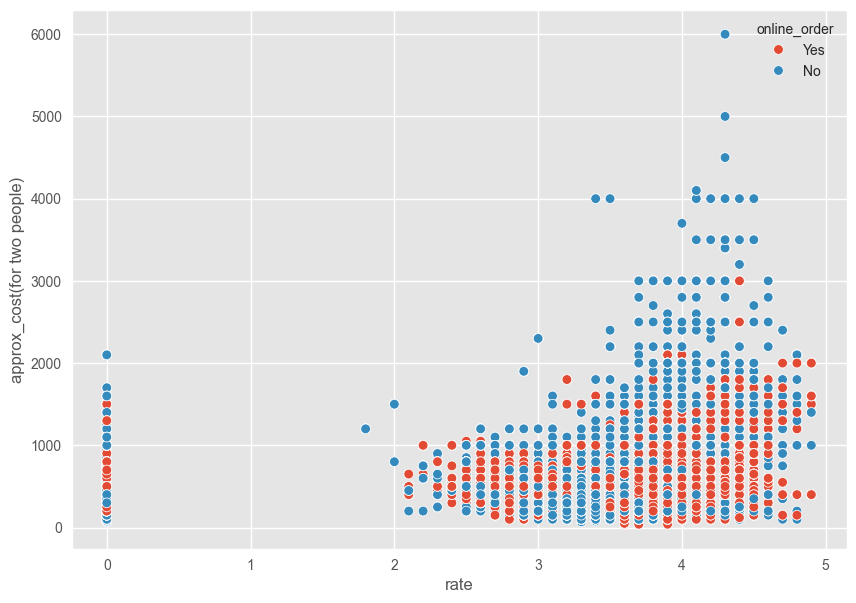

In [18]:

cost_dist=df[['rate','approx_cost(for two people)','online_order']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)']=cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',','')))

plt.figure(figsize=(10,7))
sns.scatterplot(x="rate",y='approx_cost(for two people)',hue='online_order',data=cost_dist)
plt.show()

- 

### Distribution of cost for two people

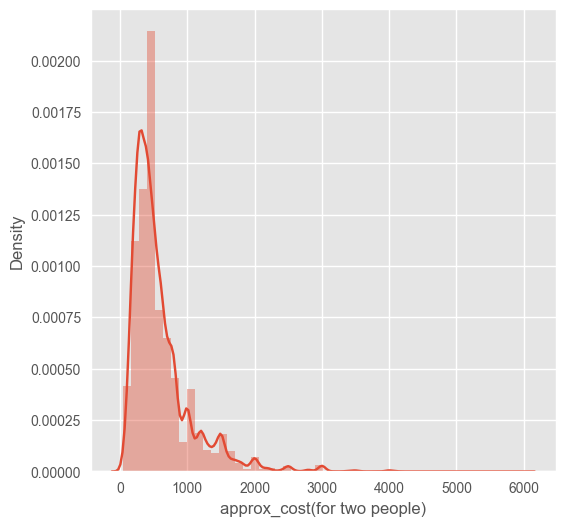

In [19]:
plt.figure(figsize=(6,6))
sns.distplot(cost_dist['approx_cost(for two people)'])
plt.show()

- We can see that the distribution if left skewed.
- This means almost 90percent of restaurants serve food for budget less than 1000 INR.($15)

### Is there any difference b/w votes of restaurants accepting and not accepting online orders?

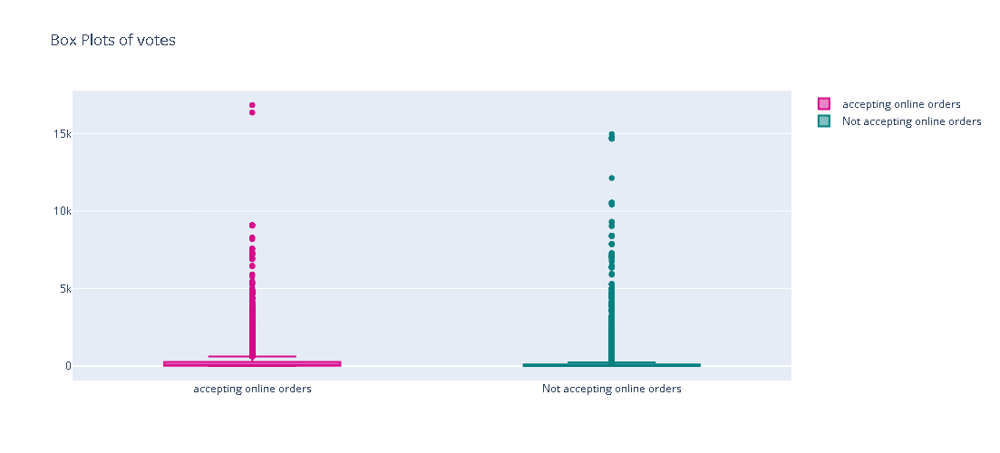

In [20]:


votes_yes=df[df['online_order']=="Yes"]['votes']
trace0=go.Box(y=votes_yes,name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))

votes_no=df[df['online_order']=="No"]['votes']
trace1=go.Box(y=votes_no,name="Not accepting online orders",
              marker = dict(
        color = 'rgb(0, 128, 128)',
    ))

layout = go.Layout(
    title = "Box Plots of votes",width=800,height=500
)

data=[trace0,trace1]
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)




1. Yes,you can observe that median number of votes for both categories vary.
2. Restaurants accepting online orders tend to get more votes from customers as there is a rating option poping up after each order through zomato application.

## Which are the most common restaurant type in Banglore?


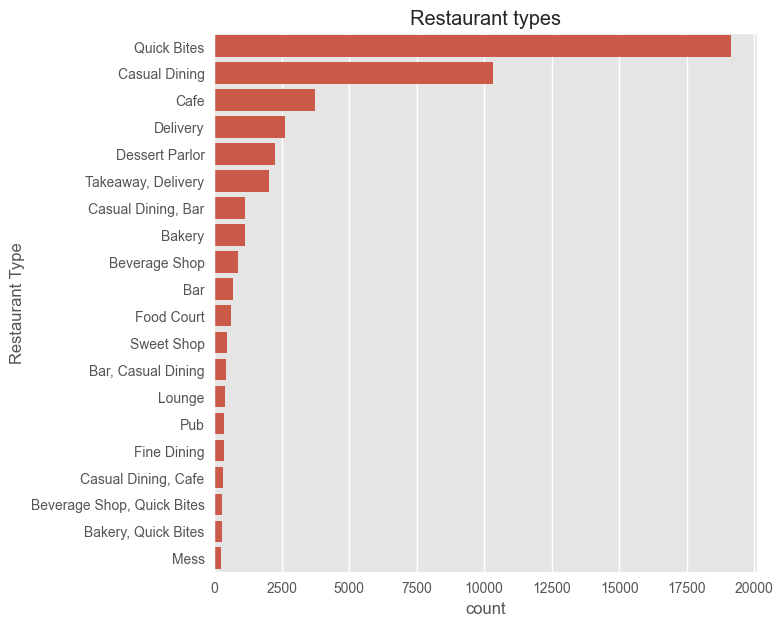

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(7,7))
rest = df['rest_type'].value_counts()[:20]
sns.barplot(x=rest.values, y=rest.index)
plt.title("Restaurant types")
plt.xlabel("count")
plt.ylabel("Restaurant Type")
plt.show()


1. No doubt about this as Banglore is known as the tech capital of India,people having busy and modern life will prefer Quick Bites.
2. We can observe tha Quick Bites type restaurants dominates.

### Cost factor ?


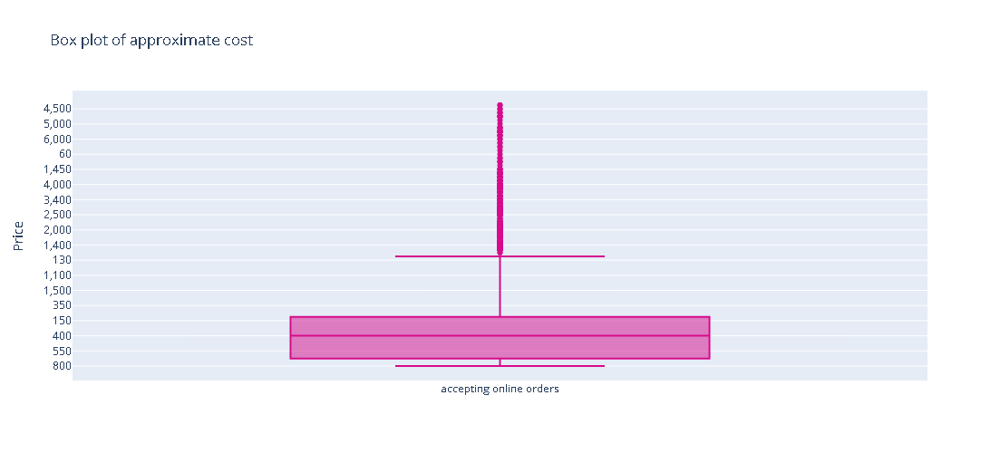

In [22]:
trace0=go.Box(y=df['approx_cost(for two people)'],name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))
data=[trace0]
layout=go.Layout(title="Box plot of approximate cost",width=800,height=500,yaxis=dict(title="Price"))
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)

1. The median approximate cost for two people is 400 for a single meal.
2. 50 percent of restaurants charge between 300 and 650 for single meal for two people.


### Finding Best budget Restaurants in any location

- I have implemented a simple filtering mechanism to find best budget restaurants in any locations in Bangalore.
- You can pass location and restaurant type as parameteres,function will return name of restaurants.


In [23]:
cost_dist=df[['rate','approx_cost(for two people)','location','name','rest_type']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)']=cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',','')))
def return_budget(location,rest):
    budget=cost_dist[(cost_dist['approx_cost(for two people)']<=400) & (cost_dist['location']==location) & 
                     (cost_dist['rate']>4) & (cost_dist['rest_type']==rest)]
    return(budget['name'].unique())
return_budget('BTM',"Quick Bites")

array(['Swadista Aahar', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Chaatimes', "Muthashy's", 'Swad Punjab Da',
       "Domino's Pizza", 'Roti Wala', 'Andhra Kitchen'], dtype=object)

## Which are the foodie areas?


<AxesSubplot: xlabel='location', ylabel='None'>

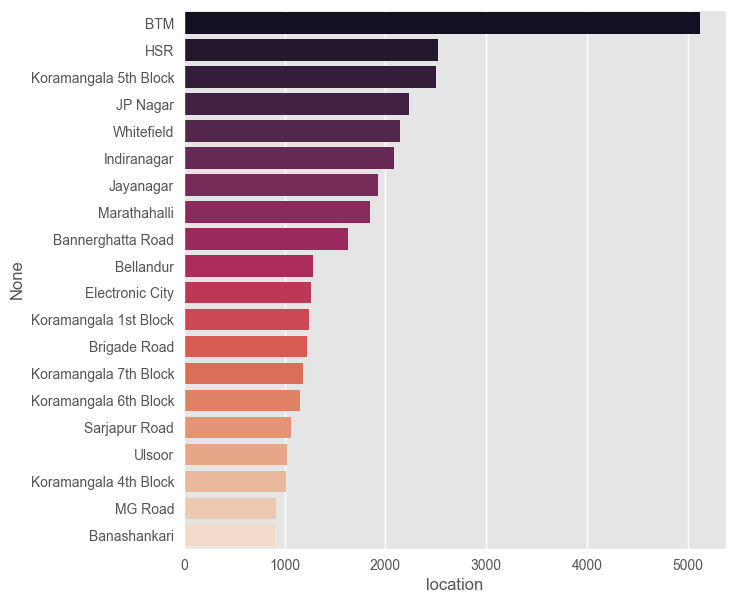

In [24]:
plt.figure(figsize=(7,7))
Rest_locations=df['location'].value_counts()[:20]
sns.barplot(x=Rest_locations,y=Rest_locations.index,palette="rocket")

1. We can see that **BTM,HSR and Koranmangala 5th block** has the most number of restaurants.
2. BTM dominates the section by having more than 5000 restaurants.

## Which are the most common cuisines in each locations?


In [25]:
df_1=df.groupby(['location','cuisines']).agg('count')
data=df_1.sort_values(['url'],ascending=False).groupby(['location'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})
data.head(10)

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",379
1,0,BTM,North Indian,340
2,0,BTM,Biryani,120
3,1,Banashankari,South Indian,86
4,1,Banashankari,"North Indian, Chinese",61
5,1,Banashankari,North Indian,36
6,2,Banaswadi,South Indian,37
7,2,Banaswadi,"North Indian, Chinese",24
8,2,Banaswadi,Biryani,23
9,3,Bannerghatta Road,"North Indian, Chinese",130


## Extracting location information using Geopy


In [26]:
locations=pd.DataFrame({"Name":df['location'].unique()})
locations['Name']=locations['Name'].apply(lambda x: "Bangalore " + str(x))
lat_lon=[]
geolocator=Nominatim(user_agent="app")
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:    
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)


locations['geo_loc']=lat_lon
locations.to_csv('locations.csv',index=False)
locations["Name"]=locations['Name'].apply(lambda x :  x.replace("Bangalore","")[1:])
locations.head()

,Name,geo_loc
0,Banashankari,"(12.9393328, 77.5539819)"
1,Basavanagudi,"(12.9417261, 77.5755021)"
2,Mysore Road,"(12.4180863, 76.6724199)"
3,Jayanagar,"(12.9418488, 77.5868976)"
4,Kumaraswamy Layout,"(12.9067683, 77.5595021)"


- We have found out latitude and longitude of each location listed in the dataset using geopy.
- This is used to plot maps.

## Heatmap of restaurant count on each location


In [27]:
Rest_locations=pd.DataFrame(df['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
Rest_locations['count'].max()
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map
lat,lon=zip(*np.array(Rest_locations['geo_loc']))
Rest_locations['lat']=lat
Rest_locations['lon']=lon
basemap=generateBaseMap()
HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

1. It is clear that restaurants tend to concentrate in central bangalore area.
2. The clutter of restaurants lowers are we move away from central.
3. So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.

## What are  the most popular cuisines of Bangalore?


Text(0.5, 1.0, 'Most popular cuisines of Bangalore')

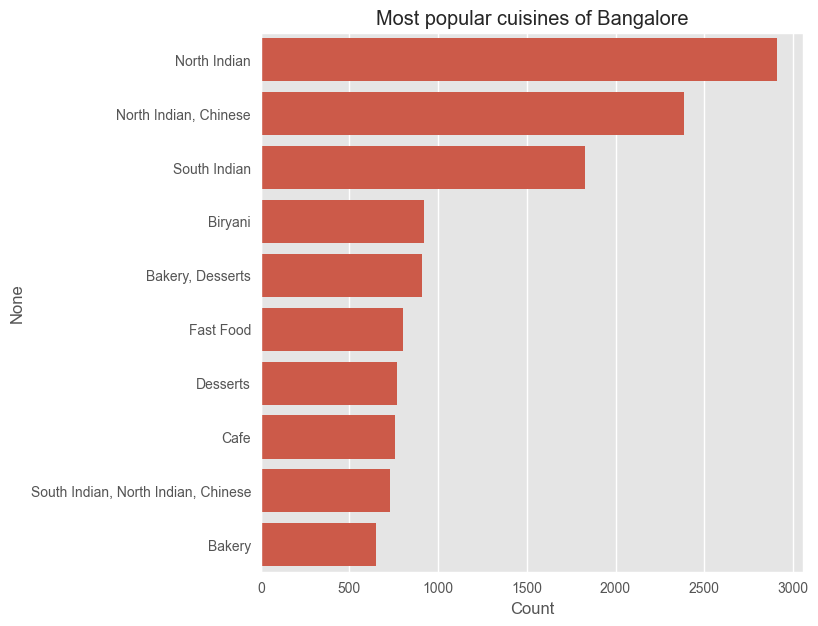

In [28]:
plt.figure(figsize=(7,7))
cuisines=df['cuisines'].value_counts()[:10]
sns.barplot(x=cuisines,y=cuisines.index)
plt.xlabel('Count')
plt.title("Most popular cuisines of Bangalore")

1. We can observe that **North Indian,chinese,South Indian and Biriyani** are most common.
2. Is this imply the fact that Banglore is more influenced by North Indian culture more than South?
- We will inspect further......

## Heatmap of North Indian restaurants


In [29]:
def produce_data(col,name):
    data= pd.DataFrame(df[df[col]==name].groupby(['location'],as_index=False)['url'].agg('count'))
    data.columns=['Name','count']
    print(data.head())
    data=data.merge(locations,on="Name",how='left').dropna()
    data['lan'],data['lon']=zip(*data['geo_loc'].values)
    return data.drop(['geo_loc'],axis=1)
North_India=produce_data('cuisines','North Indian')
basemap=generateBaseMap()
HeatMap(North_India[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

                Name  count
0                BTM    340
1       Banashankari     36
2          Banaswadi     12
3  Bannerghatta Road     75
4       Basavanagudi     21


1. Interesting to see a cluster of North Indian Restaurants in South Bangalore area !
2. This may indicate that these areas are more populated by North Indians.

## What about South  Indian cuisines?


In [30]:
food=produce_data('cuisines','South Indian')
basemap=generateBaseMap()
HeatMap(food[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

                Name  count
0                BTM    113
1       Banashankari     86
2          Banaswadi     37
3  Bannerghatta Road     48
4       Basavanagudi     89


1. They tend to span all over Bangalore.
2. South Indian cuisines tend to cluster near central Bangalore.

## Which are the most popular casual dining restaurant chains?


In [31]:
def produce_chains(name):
    data_chain=pd.DataFrame(df[df["name"]==name]['location'].value_counts().reset_index())
    data_chain.columns=['Name','count']
    data_chain=data_chain.merge(locations,on="Name",how="left").dropna()
    data_chain['lan'],data_chain['lon']=zip(*data_chain['geo_loc'].values)
    return data_chain[['Name','count','lan','lon']]


In [32]:
mapbox_access_token="pk.eyJ1Ijoic2hhaHVsZXMiLCJhIjoiY2p4ZTE5NGloMDc2YjNyczBhcDBnZnA5aCJ9.psBECQ2nub0o25PgHcU88w"


In [33]:
df_1=df.groupby(['rest_type','name']).agg('count')
datas=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})

casual=datas[datas['rest_type']=='Casual Dining']
casual

,level_0,rest_type,name,count
59,27,Casual Dining,Empire Restaurant,58
60,27,Casual Dining,Beijing Bites,48
61,27,Casual Dining,Mani's Dum Biryani,47


- We can see tht **Empire restaurant,Beijing bites and Mani's dum biriyani** are the most popular casual dining restaurant chains in Bangalore.
- We will inspect them further...

## Where are their outlets located?


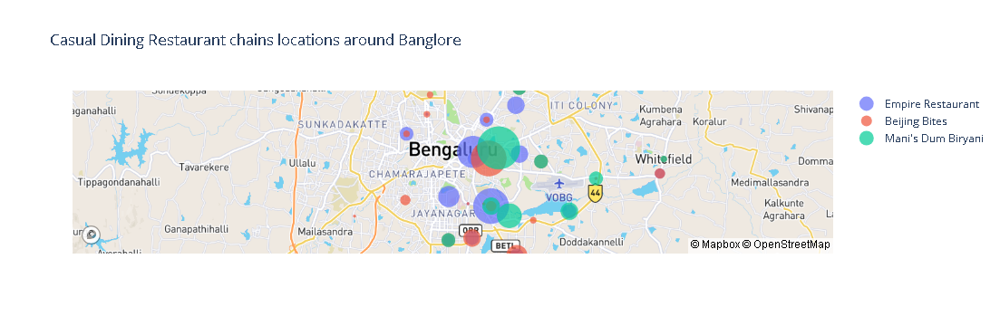

In [34]:
def produce_trace(data_chain,name):
        data_chain['text']=data_chain['Name']+'<br>'+data_chain['count'].astype(str)
        trace =  go.Scattermapbox(
           
                lat=data_chain['lan'],
                lon=data_chain['lon'],
                mode='markers',
                marker=go.scattermapbox.Marker(
                    size=data_chain['count']*4
                ),
                text=data_chain['text'],name=name
            )
        
        return trace
    
data=[] 
for row in casual['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Casual Dining Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

1. We can see that **Mani's dum biriyani** restaurant has half of their restaurants in central Banglore.
2. **Empire Restaurant** is present in all over Banglore.
3. **Mani's dum Biriyani** has 12 outlets in ulsoor,which is the most in a single location.

## Top quick bites restaurant chains in Banglore


In [35]:
quick=datas[datas['rest_type']=='Quick Bites']
quick 

,level_0,rest_type,name,count
179,78,Quick Bites,Five Star Chicken,69
180,78,Quick Bites,Domino's Pizza,60
181,78,Quick Bites,McDonald's,59


- Surprisingly  **Five star chicken** dominates in quick bites restaurant types overtaking famous **Domino's Pizza and McDonald's**.
- Five Star Chicken is a branch of Charoen Pokphand Group Foods, a Thai multinational conglomerate with over $12 billion business in Agro and Food       Industries. Five Star Chicken specialties in fried chicken.

## Where are their outlets located?


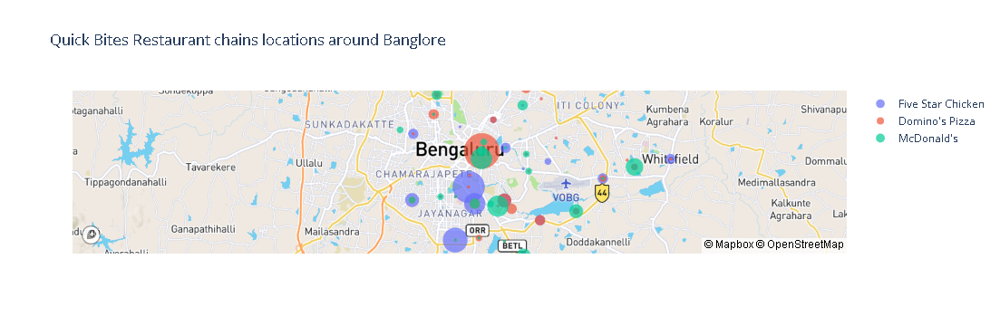

In [36]:
data=[]  
for row in quick['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Quick Bites Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

## Top Cafes of Banglore?


In [37]:
cafe=datas[datas['rest_type']=='Cafe']
cafe

,level_0,rest_type,name,count
41,19,Cafe,Cafe Coffee Day,96
42,19,Cafe,Smally's Resto Cafe,54
43,19,Cafe,Mudpipe Cafe,39


- No surprises,Cafe coffee day restaurant dominated way over other cafe chains in Banglore.
- Cafe coffee day has 96 outlets in Banglore.
- Café Coffee Day was started as a retail restaurant in 1996. The first CCD outlet was set up on July 11, 1996, at Brigade Road, Bengaluru, Karnataka.


## Where are their outlets located?


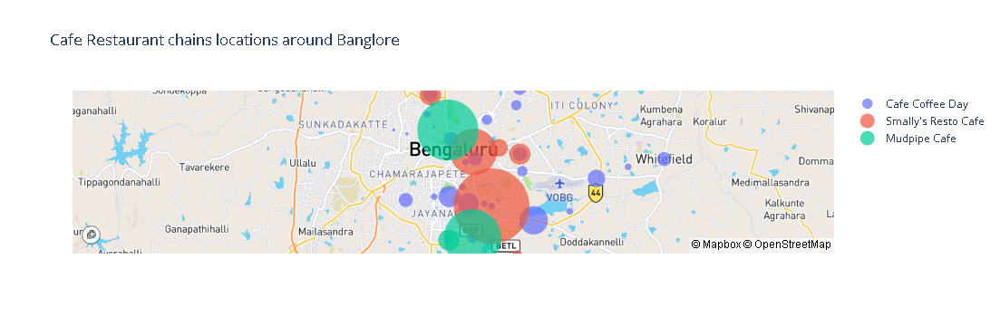

In [38]:
data=[]  
for row in cafe['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Cafe Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

## [Analysing Reviews]()<a id="26"></a><br>

- In this section we will go on to prepare reviews dataframe.
- We will extract reviews and ratings of each restaurant and create a dataframe with it.


In [44]:
all_ratings = []

for name,ratings in tqdm(zip(df['name'],df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name,score, doc])
rating_df=pd.DataFrame(all_ratings,columns=['name','rating','review'])
rating_df['review']=rating_df['review'].apply(lambda x : re.sub('[^a-zA-Z0-9\s]',"",x))
rating_df.to_csv(r"C:\Users\srika\Downloads\archive (33)\Ratings.csv")
rating_df.head()

51717it [00:38, 1332.00it/s]


,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


## [WordCloud of Reviews of restaurant chains]()<a id="27"></a><br>

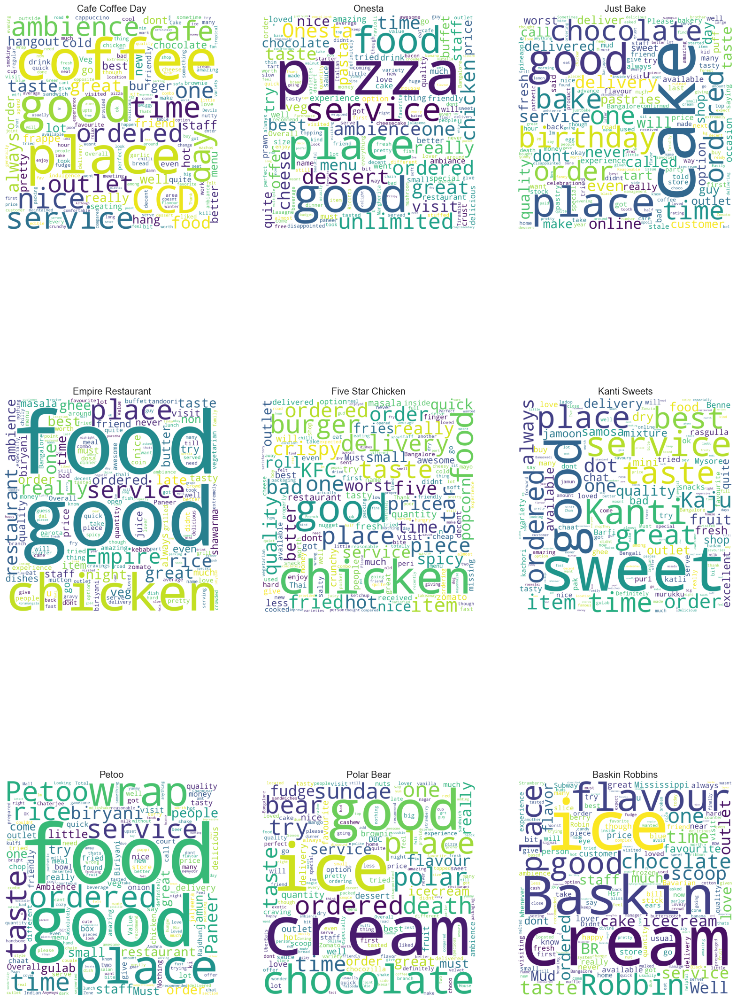

In [45]:
rest=df['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus=' '.join(x  for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
produce_wordcloud(rest)


## [Rating distribution]()<a id="28" ></a><br>

Text(0, 0.5, 'count')

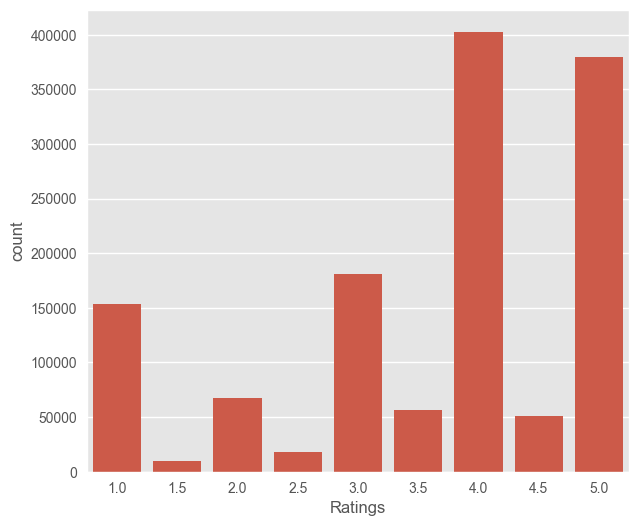

In [46]:
plt.figure(figsize=(7,6))
rating=rating_df['rating'].value_counts()
sns.barplot(x=rating.index,y=rating)
plt.xlabel("Ratings")
plt.ylabel('count')

## [Topic modelling]()<a id="33" ></a><br>

We will do topic modelling for postive and negative comments seperately to understand the different between the two types.

##  [Topic modeling for positive comments]()<a id="34" ></a><br>

- As the first step we will divide comments as negative and positive on the basis on rating provided.
- Comments with rating below 2.5 is classified as negative and greater tham 2.5 as classified as positive.

In [47]:
rating_df['sent']=rating_df['rating'].apply(lambda x: 1 if int(x)>2.5 else 0)


Now,
   - we will remove stopwords
   - Lemmatize each word
   - Create corpus
   - Tokenize them

In [48]:
stops=stopwords.words('english')
lem=WordNetLemmatizer()
corpus=' '.join(lem.lemmatize(x) for x in rating_df[rating_df['sent']==1]['review'][:3000] if x not in stops)
tokens=word_tokenize(corpus)


> Now we will  use **Termfrequency Inverse doc frequency(Tfidf)** to vectorize the tokens.

In [49]:

vect=TfidfVectorizer()
vect_fit=vect.fit(tokens)
    

In [50]:
id_map=dict((v,k) for k,v in vect.vocabulary_.items())
vectorized_data=vect_fit.transform(tokens)
gensim_corpus=gensim.matutils.Sparse2Corpus(vectorized_data,documents_columns=False)
ldamodel = gensim.models.ldamodel.LdaModel(gensim_corpus,id2word=id_map,num_topics=5,random_state=34,passes=25)


## [Visualizing output]()<a id="28" ></a><br>

**Word Counts of Topic Keywords**

When it comes to the keywords in the topics, the importance (weights) of the keywords matters. Along with that, how frequently the words have appeared in the documents is also interesting to look.

Let’s plot the word counts and the weights of each keyword in the same chart.

You want to keep an eye out on the words that occur in multiple topics and the ones whose relative frequency is more than the weight. Often such words turn out to be less important. The chart I’ve drawn below is a result of adding several such words to the stop words list in the beginning and re-running the training process.

In [51]:
counter=Counter(corpus)

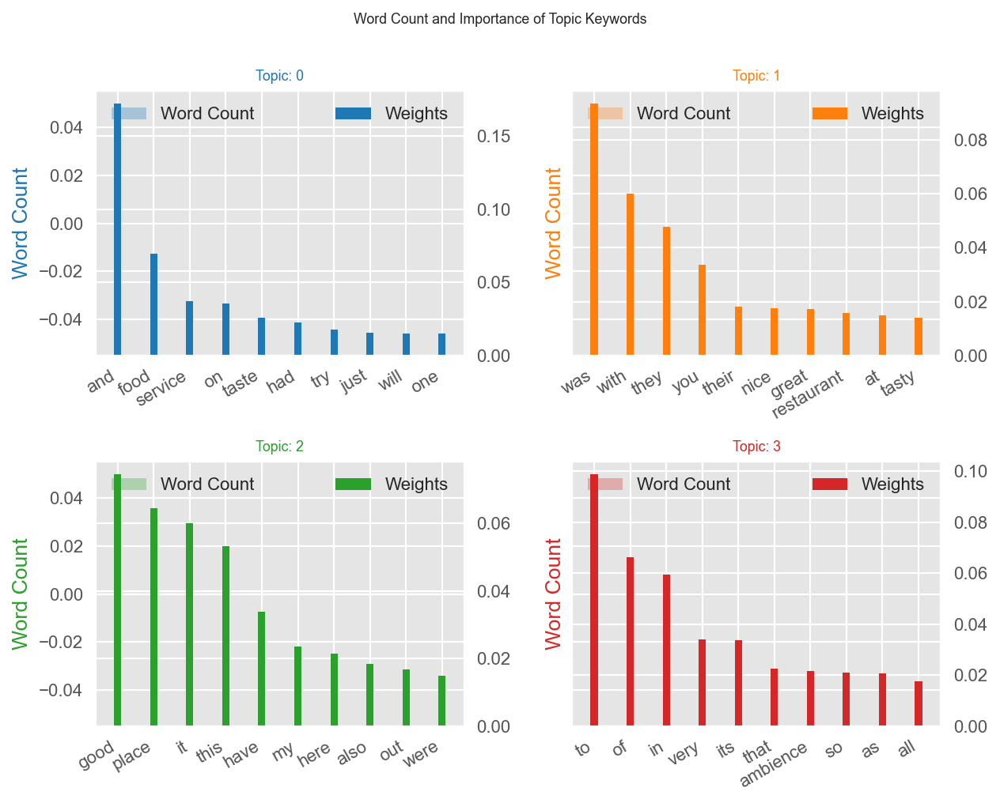

In [52]:
out=[]
topics=ldamodel.show_topics(formatted=False)
for i,topic in topics:
    for word,weight in topic:
        out.append([word,i,weight,counter[word]])

dataframe = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        


# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(8,6), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.3, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    #ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=8)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(dataframe.loc[dataframe.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=8, y=1.05)    
plt.show()

## [Topic modeling for negative comments]()<a id="35" ></a><br>

In [53]:
stops=stopwords.words('english')
lem=WordNetLemmatizer()
corpus=' '.join(lem.lemmatize(x) for x in rating_df[rating_df['sent']==0]['review'][:3000] if x not in stops)
tokens=word_tokenize(corpus)

In [54]:
vect=TfidfVectorizer()
vect_fit=vect.fit(tokens)
id_map=dict((v,k) for k,v in vect.vocabulary_.items())
vectorized_data=vect_fit.transform(tokens)
gensim_corpus=gensim.matutils.Sparse2Corpus(vectorized_data,documents_columns=False)
ldamodel = gensim.models.ldamodel.LdaModel(gensim_corpus,id2word=id_map,num_topics=5,random_state=34,passes=25)

 

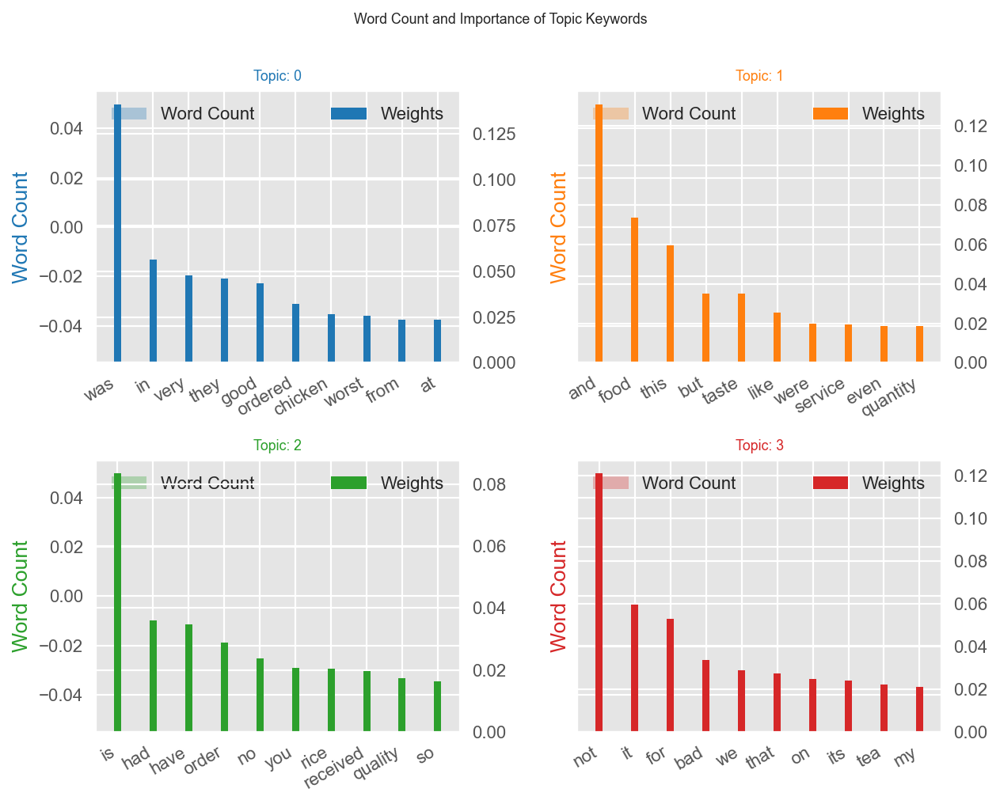

In [55]:
counter=Counter(corpus)
out=[]
topics=ldamodel.show_topics(formatted=False)
for i,topic in topics:
    for word,weight in topic:
        out.append([word,i,weight,counter[word]])

dataframe = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        


# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(8,6), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.3, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    #ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=8)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(dataframe.loc[dataframe.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=8, y=1.05)    
plt.show()



- We can clearly observe the difference between the two types of comments
- The words used are clearly distinguishable.
- The words used in negative comments are clearly critisizing.
- The word used in positive comments  are clearly appreciating.

### T-SNE of Reviews 

In this section we will visualize words used in reviews in a 2 dimensional space.
- For that we will first lemmatize and tokenize each reviews and build a corpus out of it.

In [56]:
stops=set(stopwords.words('english'))
lem=WordNetLemmatizer()
corpus=[]
for review in tqdm(rating_df['review'][:10000]):
    words=[]
    for x in word_tokenize(review):
        x=lem.lemmatize(x.lower())
        if x not in stops:
            words.append(x)
            
    corpus.append(words)

100%|██████████████████████████████████████████████████████████████████████████| 10000/10000 [00:03<00:00, 3238.37it/s]


Now we will use word2vec to represent each word as a vector.

In [57]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def tsne_plot(model):
    labels = []
    tokens = []

    for word in model.wv.index_to_key:
        tokens.append(model.wv[word])
        labels.append(word)

    # Convert tokens to a NumPy array
    tokens = np.array(tokens)

    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

# Assuming 'model' is your trained Word2Vec model
tsne_plot(model)


NameError: name 'model' is not defined

### T-SNE of adjectivs used in postive reviews

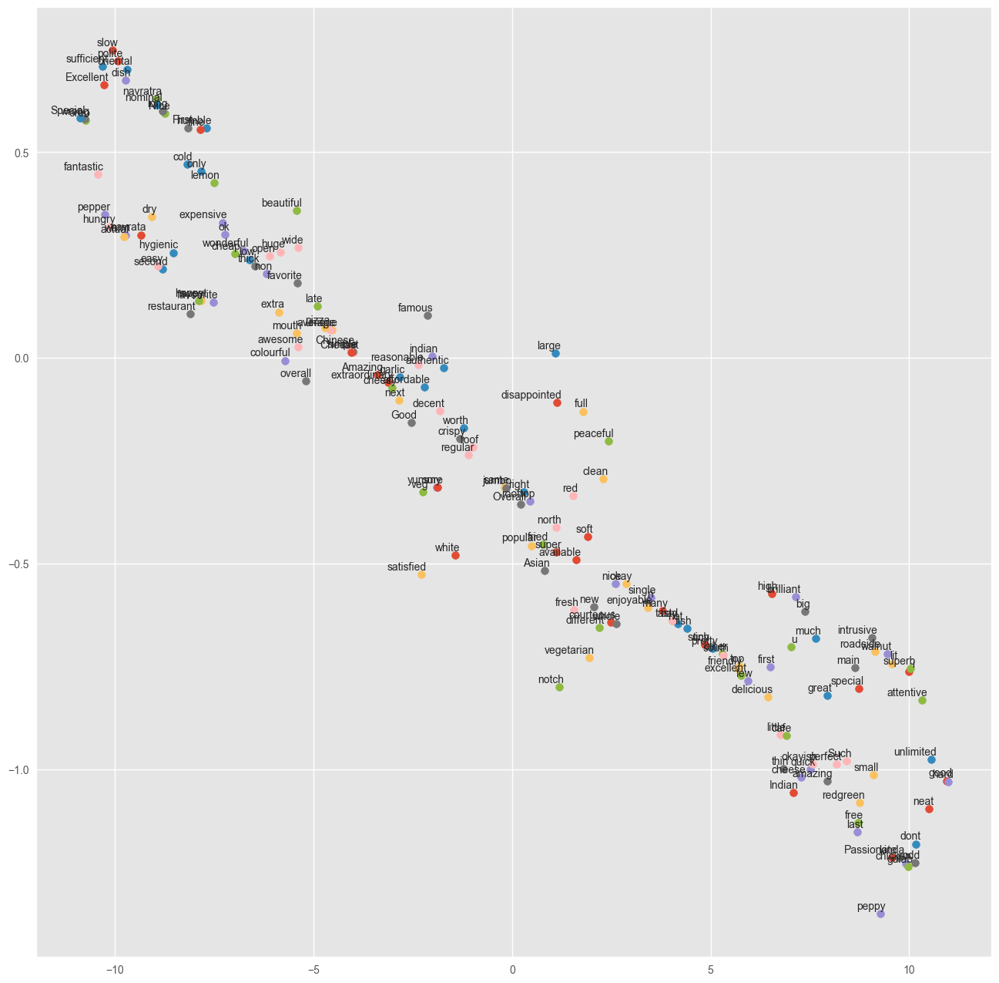

In [58]:
postive=rating_df[rating_df['rating']>3]['review'][:2000]
negative=rating_df[rating_df['rating']<2.5]['review'][:2000]

def return_corpus(df):
    corpus=[]
    for review in df:
        tagged=nltk.pos_tag(word_tokenize(review))
        adj=[]
        for x in tagged:
            if x[1]=='JJ':
                adj.append(x[0])
        corpus.append(adj)
    return corpus
corpus=return_corpus(postive)
model = word2vec.Word2Vec(corpus, vector_size=100, min_count=10,window=20, workers=4)
tsne_plot(model)

Wow,we can observe all the adjective used in the postive reviews represented in the 2D space.

### T-SNE of adjectives used in Negative reviews

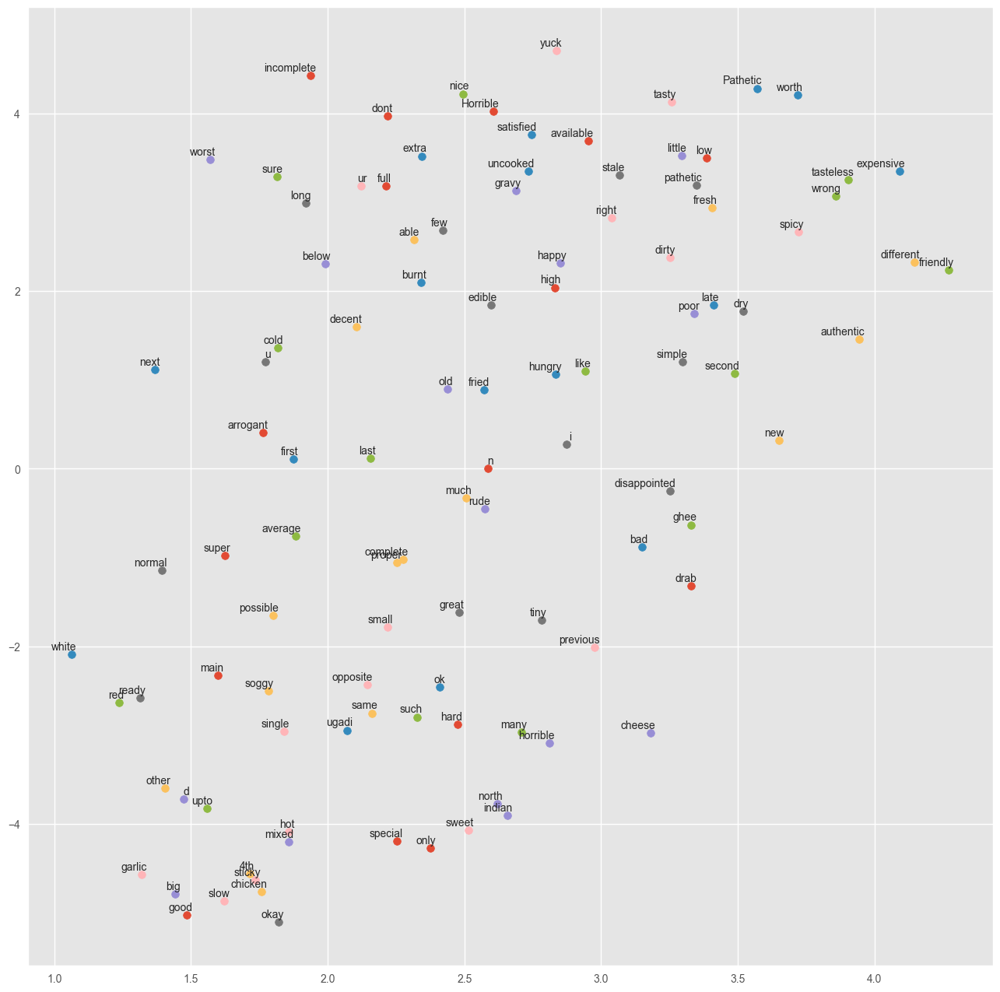

In [59]:
corpus=return_corpus(negative)
model = word2vec.Word2Vec(corpus, vector_size=100, min_count=10,window=20, workers=4)
tsne_plot(model)

## [Sentimental Analysis]()<a id="29" ></a><br>

Sentiment Analysis is the process of computationally determining whether a piece of writing is positive, negative or neutral. It’s also known as opinion mining, deriving the opinion or attitude of a speaker.



![](https://www.geeksforgeeks.org/wp-content/uploads/Twitter-Sentiment-Analysis-using-Python.jpg)

## [Data preparation]()<a id="30" ></a><br>


For doing sentimental analysis on reviews provided bt users.We have to prepare our data in appropriate format.
We will map reviews to positive and negative on the basis of the ratings provided by each user.So,we will map reviews to negative if the rating given is less than 2.5 and positive if rating is greater than 2.5 


In [64]:
rating_df['sent']=rating_df['rating'].apply(lambda x: 1 if int(x)>2.5 else 0)

- Next, we will tokenize the data and vectorize the reviews to feed it to our model.


In [65]:
max_features=3000
tokenizer=Tokenizer(num_words=max_features,split=' ')
tokenizer.fit_on_texts(rating_df['review'].values)
X = tokenizer.texts_to_sequences(rating_df['review'].values)
X = pad_sequences(X)


## [Building our model]()<a id="31" ></a><br>

In [50]:
embed_dim = 32
lstm_out = 32

model = Sequential()
model.add(Embedding(max_features, embed_dim,input_length = X.shape[1]))
#model.add(SpatialDropout1D(0.4))
model.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(2,activation='softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 194, 32)           96000     
                                                                 
 lstm (LSTM)                 (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 2)                 66        
                                                                 
Total params: 104,386
Trainable params: 104,386
Non-trainable params: 0
_________________________________________________________________
None


#### Train and test split

- We will now encode our target variable. **pd.get_dummies** is used for on-hot encoding.
- 33 percent of data is reserved for testing our model

In [66]:
Y = pd.get_dummies(rating_df['sent'].astype(int)).values
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.33, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)



(884378, 194) (884378, 2)
(435590, 194) (435590, 2)


In [52]:
batch_size = 3200
model.fit(X_train, Y_train, epochs = 5, batch_size=batch_size)


Epoch 1/5
277/277 [==============================] - 308s 1s/step - loss: 0.2507 - accuracy: 0.8990
Epoch 2/5
277/277 [==============================] - 290s 1s/step - loss: 0.1488 - accuracy: 0.9415
Epoch 3/5
277/277 [==============================] - 316s 1s/step - loss: 0.1340 - accuracy: 0.9479
Epoch 4/5
277/277 [==============================] - 299s 1s/step - loss: 0.1221 - accuracy: 0.9538
Epoch 5/5
277/277 [==============================] - 302s 1s/step - loss: 0.1136 - accuracy: 0.9572


### [Validating our model]()<a id="32" ></a><br>

We will take 1500 rows to validate our model.We have choosen **accuracy** to be our evaluation criteria.

In [54]:
validation_size = 1500

X_validate = X_test[-validation_size:]
Y_validate = Y_test[-validation_size:]
X_test = X_test[:-validation_size]
Y_test = Y_test[:-validation_size]
score,acc = model.evaluate(X_test, Y_test, verbose = 2, batch_size = batch_size)
print("score: %.2f" % (score))
print("acc: %.2f" % (acc))

136/136 - 12s - loss: 0.1074 - accuracy: 0.9604 - 12s/epoch - 90ms/step
score: 0.11
acc: 0.96


### [Modelling using Pycaret]()<a id="32" ></a><br>

In [1]:
from pycaret.regression import *

In [73]:
ds = df.copy()

In [74]:
ds.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [72]:
from textblob import TextBlob

In [75]:
sent=[]
for i in range(0,len(ds)):
    analysis = TextBlob(ds.loc[i,"reviews_list"])
    if analysis.sentiment.polarity > 0:
        sent.append("positive")
    elif analysis.sentiment.polarity == 0:
        sent.append("Neutral")
    else:
        sent.append("negative")
ds["reviews_list"]=sent

In [76]:
ds["Count"]=1
pos=ds[ds["reviews_list"]=="positive"]
neg=ds[ds["reviews_list"]=="negative"]
cnt_pos=pos.groupby("listed_in(type)").sum()
cnt_neg=neg.groupby("listed_in(type)").sum()

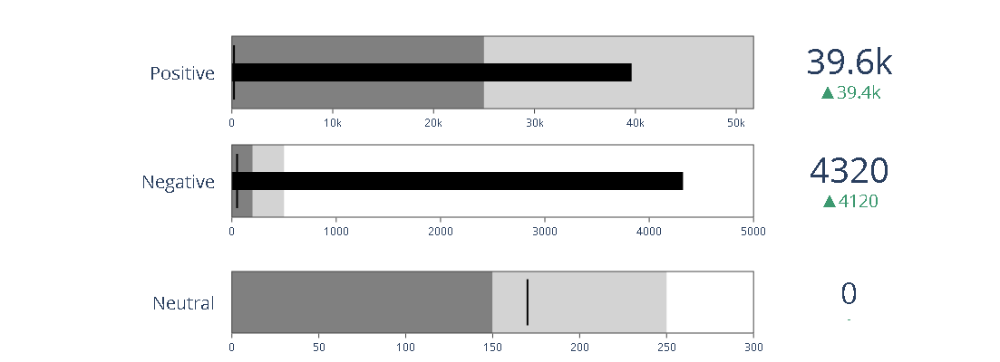

In [77]:
fig = go.Figure()

fig.add_trace(go.Indicator(
    mode = "number+gauge+delta", value = 0,
    delta = {'reference': 0},
    domain = {'x': [0.25, 1], 'y': [0.08, 0.25]},
    title = {'text': "Neutral"},
    gauge = {
        'shape': "bullet",
        'axis': {'range': [None, 300]},
        'threshold': {
            'line': {'color': "black", 'width': 2},
            'thickness': 0.75,
            'value': 170},
        'steps': [
            {'range': [0, 150], 'color': "gray"},
            {'range': [150, 250], 'color': "lightgray"}],
        'bar': {'color': "black"}}))

fig.add_trace(go.Indicator(
    mode = "number+gauge+delta", value = 4324,
    delta = {'reference': 200},
    domain = {'x': [0.25, 1], 'y': [0.4, 0.6]},
    title = {'text': "Negative"},
    gauge = {
        'shape': "bullet",
        'axis': {'range': [None, 5000]},
        'threshold': {
            'line': {'color': "black", 'width': 2},
            'thickness': 0.75,
            'value': 50},
        'steps': [
            {'range': [0, 200], 'color': "gray"},
            {'range': [200, 500], 'color': "lightgray"}],
        'bar': {'color': "black"}}))

fig.add_trace(go.Indicator(
    mode = "number+gauge+delta", value = 39629,
    delta = {'reference': 200},
    domain = {'x': [0.25, 1], 'y': [0.7, 0.9]},
    title = {'text' :"Positive"},
    gauge = {
        'shape': "bullet",
        'axis': {'range': [None, 51717]},
        'threshold': {
            'line': {'color': "black", 'width': 2},
            'thickness': 0.75,
            'value': 210},
        'steps': [
            {'range': [0, 25000], 'color': "gray"},
            {'range': [25000, 51717], 'color': "lightgray"}],
        'bar': {'color': "black"}}))
fig.update_layout(height = 400 , margin = {'t':0, 'b':0, 'l':0})

fig.show()

In [79]:
from plotly.subplots import make_subplots

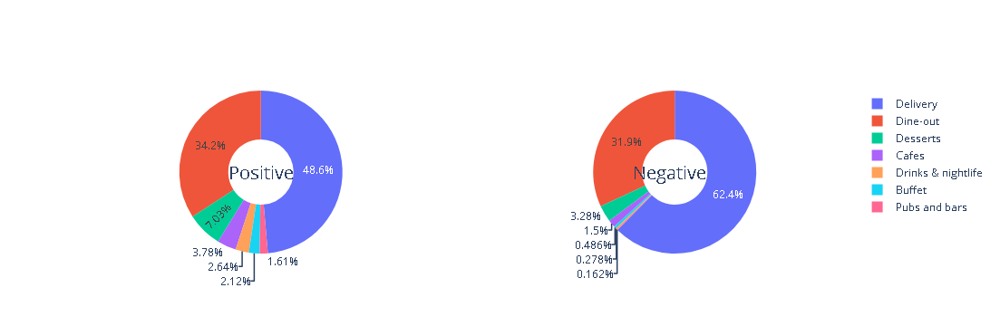

In [80]:
labels = list(cnt_pos.index)

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=list(cnt_pos.Count), name="Positive"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=list(cnt_neg.Count), name="Negative"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    annotations=[dict(text='Positive', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Negative', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()

On the Positive side , for Delivery and Dine-out has got much positive review
Whilst
On the Negative side , 62% is been given negative feedback for the Delivery

So , there is really something problem with the Delivery side

In [82]:
import plotly.express as px

In [85]:
ds

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),Count
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,positive,[],Buffet,Banashankari,1
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,positive,[],Buffet,Banashankari,1
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,positive,[],Buffet,Banashankari,1
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,positive,[],Buffet,Banashankari,1
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,positive,[],Buffet,Banashankari,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,080 40301477,Whitefield,Bar,NaN,Continental,"1,500",positive,[],Pubs and bars,Whitefield,1
51713,https://www.zomato.com/bangalore/vinod-bar-and...,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NaN,0,+91 8197675843,Whitefield,Bar,NaN,Finger Food,600,Neutral,[],Pubs and bars,Whitefield,1
51714,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,NaN,Whitefield,Bar,NaN,Finger Food,"2,000",Neutral,[],Pubs and bars,Whitefield,1
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500",positive,[],Pubs and bars,Whitefield,1


In [88]:
cost=[]
for i in range (0,len(ds)):
    it=ds.loc[i,"approx_cost(for two people)"]
    try:
        a=it.replace(",","")
        a=float(a)
        cost.append(a)
    except:
        cost.append(it)
ds["approx_cost(for two people)"]=cost

In [90]:
ds["rate"]=ds["rate"].fillna(0)
li=[]
for i in range(0,len(ds)):
    a=ds.iloc[i,5]
    try:
        b=float(a[:-2])
        li.append(b)
    except:
        li.append(0)
ds["rate"]=li

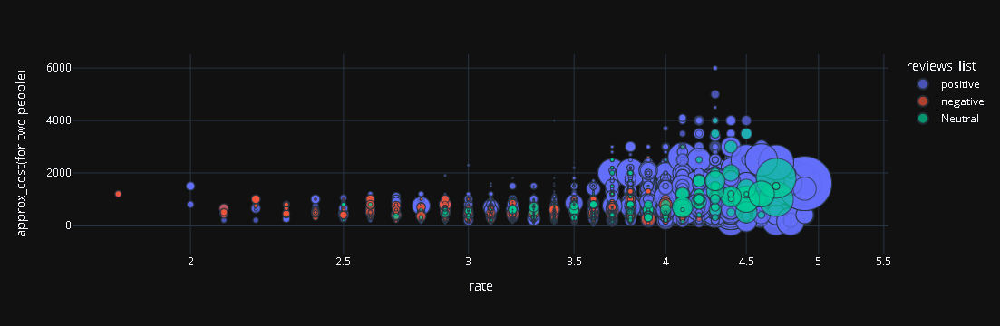

In [92]:
df = px.data.gapminder()
df_2007 = df.query("year==2007")
fig = px.scatter(ds,
                     x="rate", y="approx_cost(for two people)", size="votes", color="reviews_list",
                     log_x=True, size_max=60,
                     template="plotly_dark")
fig.show()

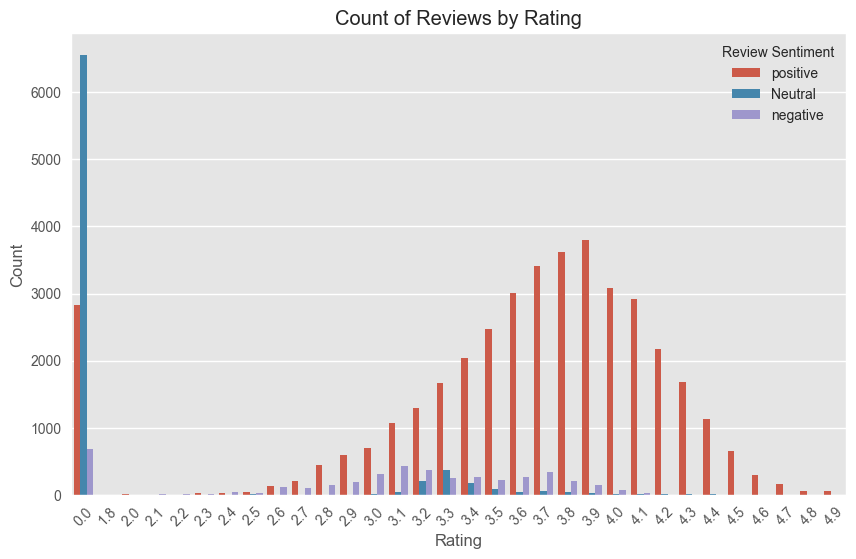

In [98]:

# 1. Count of reviews by rating
plt.figure(figsize=(10, 6))
sns.countplot(data=ds, x='rate', hue='reviews_list')
plt.title('Count of Reviews by Rating')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.legend(title='Review Sentiment')
plt.xticks(rotation=45)
plt.show()


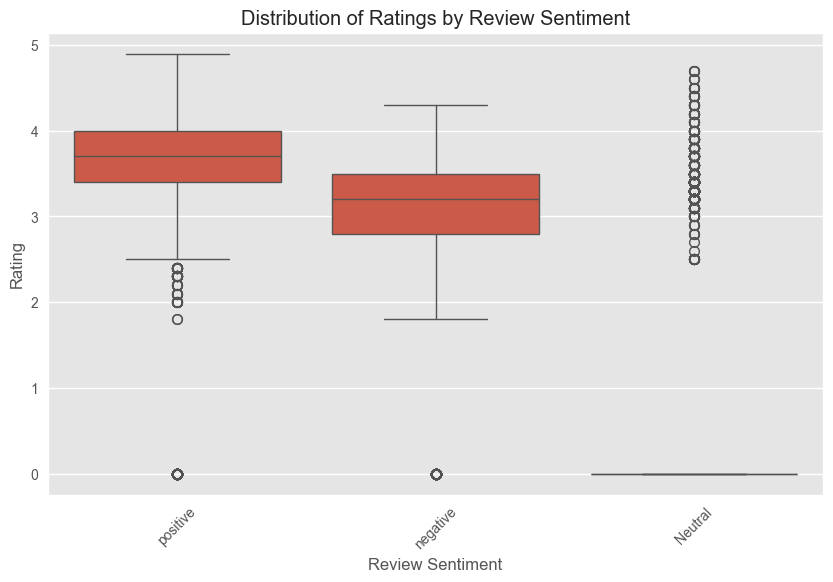

In [95]:
# 2. Distribution of ratings by review sentiment
plt.figure(figsize=(10, 6))
sns.boxplot(data=ds, x='reviews_list', y='rate')
plt.title('Distribution of Ratings by Review Sentiment')
plt.xlabel('Review Sentiment')
plt.ylabel('Rating')
plt.xticks(rotation=45)
plt.show()


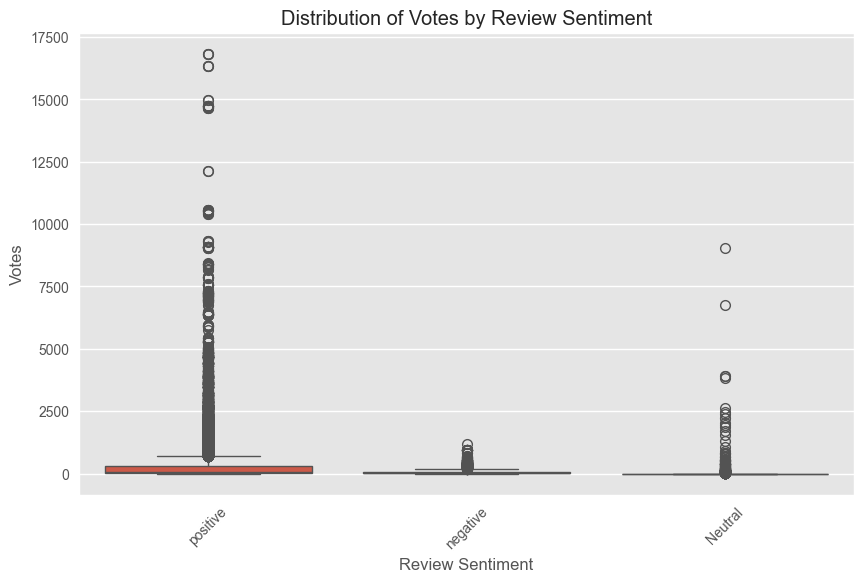

In [96]:

# 3. Distribution of votes by review sentiment
plt.figure(figsize=(10, 6))
sns.boxplot(data=ds, x='reviews_list', y='votes')
plt.title('Distribution of Votes by Review Sentiment')
plt.xlabel('Review Sentiment')
plt.ylabel('Votes')
plt.xticks(rotation=45)
plt.show()



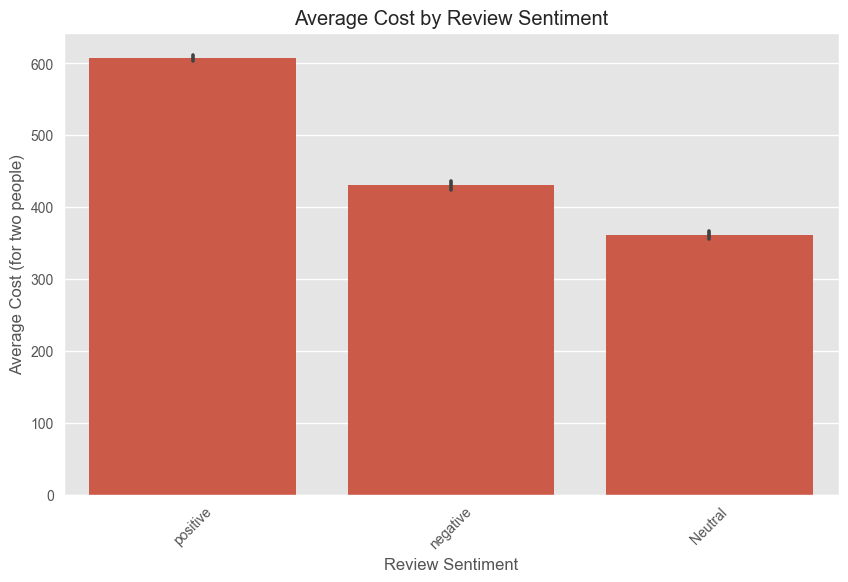

In [97]:
# 4. Average cost by review sentiment
plt.figure(figsize=(10, 6))
sns.barplot(data=ds, x='reviews_list', y='approx_cost(for two people)')
plt.title('Average Cost by Review Sentiment')
plt.xlabel('Review Sentiment')
plt.ylabel('Average Cost (for two people)')
plt.xticks(rotation=45)
plt.show()

## Preprocesing Dishes liked

In [101]:

# Split the 'dishes_liked' column and explode it
dl = ds.copy()
dl['dish_liked'] = dl['dish_liked'].str.split(',')
dl = dl.explode('dish_liked').reset_index(drop=True)

# Strip any leading/trailing whitespace from dishes_liked
dl['dish_liked'] = dl['dish_liked'].str.strip()



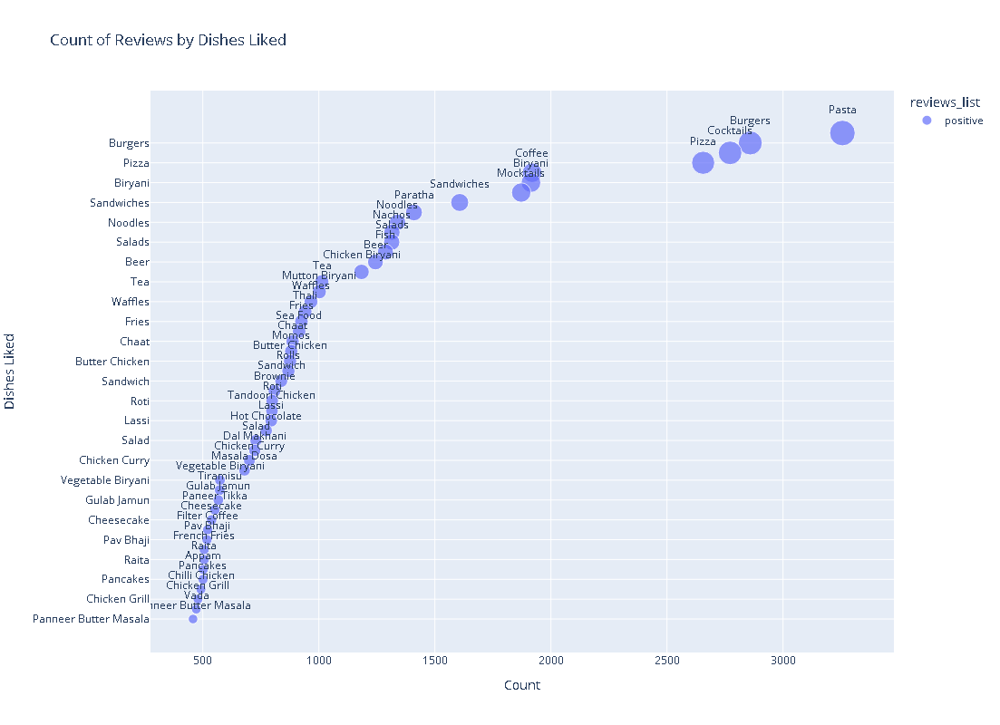

In [118]:
# Aggregate the data by 'dishes_liked' and 'reviews_list'
agg_dl = dl.groupby(['dish_liked', 'reviews_list']).size().reset_index(name='count')

# Sort by count and take the top 100 dishes
top_agg_dl = agg_dl.sort_values(by='count', ascending=False).head(50)

# Create the bubble chart
fig = px.scatter(top_agg_dl, x='count', y='dish_liked', size='count', color='reviews_list', 
                 title='Count of Reviews by Dishes Liked',
                 labels={'count': 'Count', 'dish_liked': 'Dishes Liked'},
                 hover_data={'count': True, 'dish_liked': True},
                 text='dish_liked')

# Update the layout to show text on the bubbles
fig.update_traces(textposition='top center')


fig.update_layout(yaxis={'categoryorder': 'total ascending'}, width=1200, height=800)

fig.show()

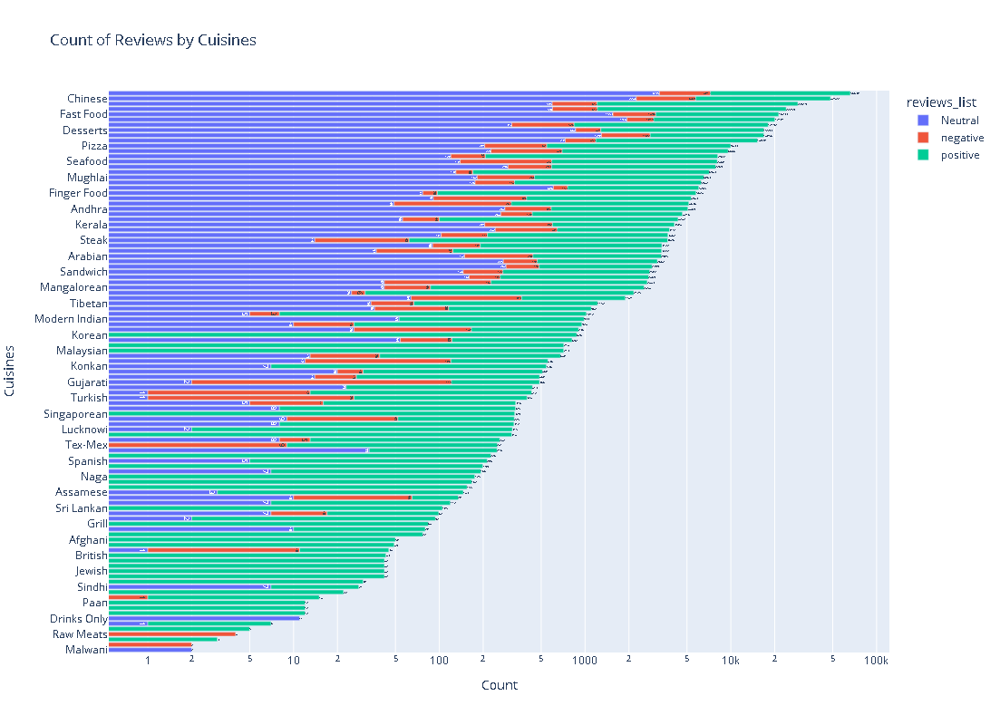

In [123]:

dl['cuisines'] = dl['cuisines'].str.split(',')
dl = dl.explode('cuisines').reset_index(drop=True)

# Strip any leading/trailing whitespace from cuisines
dl['cuisines'] = dl['cuisines'].str.strip()

# Create a count of reviews by cuisines
cuisine_counts = dl.groupby(['cuisines', 'reviews_list']).size().reset_index(name='count')

# Sort cuisines by the total count of reviews
sorted_cuisines = cuisine_counts.groupby('cuisines')['count'].sum().sort_values(ascending=False).index

# Create the bar chart using Plotly Express
fig = px.bar(cuisine_counts, 
             x='count', 
             y='cuisines', 
             color='reviews_list',
             title='Count of Reviews by Cuisines',
             labels={'count': 'Count', 'cuisines': 'Cuisines'},
             hover_data={'count': True, 'cuisines': True},
             category_orders={'cuisines': sorted_cuisines},
             text='count')

# Update layout
fig.update_layout(yaxis={'categoryorder': 'total ascending'},xaxis_type='log', width=1200, height=800)

fig.show()


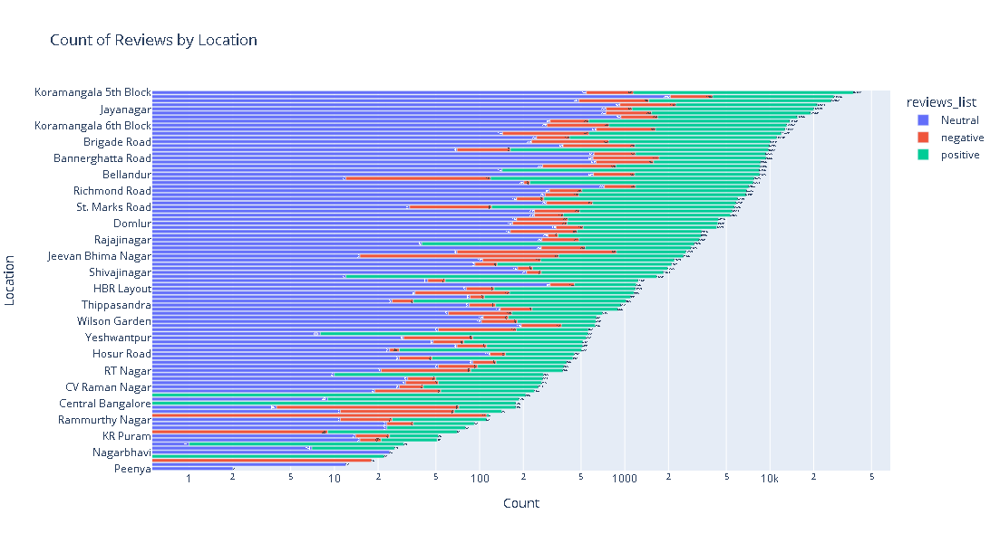

In [124]:

dl = dl.explode('location').reset_index(drop=True)

# Strip any leading/trailing whitespace from location
dl['location'] = dl['location'].str.strip()

# Create a count of reviews by location
location_counts = dl.groupby(['location', 'reviews_list']).size().reset_index(name='count')

# Sort locations by the total count of reviews
sorted_locations = location_counts.groupby('location')['count'].sum().sort_values(ascending=False).index

# Create the bar chart using Plotly Express
fig = px.bar(location_counts, 
             x='count', 
             y='location', 
             color='reviews_list',
             title='Count of Reviews by Location',
             labels={'count': 'Count', 'location': 'Location'},
             hover_data={'count': True, 'location': True},
             category_orders={'location': sorted_locations},
            text='count')

# Update layout
fig.update_layout(yaxis={'categoryorder': 'total ascending'},xaxis_type='log', width=900, height=600)

fig.show()
